### Import Libraries and Set Preferences

In [ ]:
import os

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2

import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import load_img, array_to_img, random_zoom
from keras.layers import Flatten, Dense, Conv2D, MaxPool2D, Dropout

In [ ]:
random = np.random.RandomState(42)

In [ ]:
import warnings
import logging

logging.getLogger("tensorflow").setLevel(logging.ERROR)
warnings.filterwarnings('ignore')

%config IPCompleter.use_jedi = False
%matplotlib inline

np.set_printoptions(precision=2, suppress=True)

### Loading and Displaying Dataset

- `wget` downloads a zip file containing the dataset from google drive
- `unzip` extracts to a folder `isl_images` in the same directory
- `rm` deletes the downloaded the zip file

Large amount of data is downloaded (7.62) GB, so it is better to keep a local copy of the dataset if needed

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1O_Hjvrf9x0kGPVxaD-Ye8uN32jurGXAt' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1O_Hjvrf9x0kGPVxaD-Ye8uN32jurGXAt" -O data.zip && rm -rf /tmp/cookies.txt
!unzip data.zip
!rm -rf data.zip

If we consider the base directory containing the dataset to be `"./isl_images"`, it is organized as:
```
isl_images
├── a
├── b
├── c
...
├── x
├── y
└── z
```
with each directory containing images corresponding to the class.

`sub_dirs` contains a list of these directories

In [ ]:
!python organize.py

In [ ]:
base_dir = "/wrkspc/datasets/isl_images"

train_dir = os.path.join(base_dir, "train")
test_dir = os.path.join(base_dir, "test")
validation_dir = os.path.join(base_dir, "validation")

train_sub_dirs = os.listdir(train_dir)

Here, we select any 4 directories at random from `sub_dirs`, and then from the selected directore, we display 4 randomly selected images. `random` module is used for selecting.  

`matplotlib.image.imread()` is used to read the images into an array and `matplotlib.pyplot.imshow()` is used to plot the images.  

Finally, subplots are used to display the images in a grid  

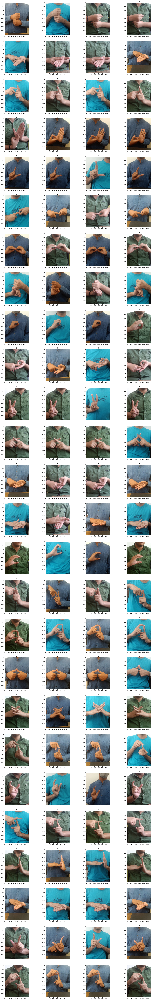

In [ ]:
# Prediction Time Graph
# Bolded Labels

nrows = 26
ncols = 4

count = 1

plt.figure(figsize=(ncols*6, nrows*6))

for i in range(nrows):
    p = os.path.join(train_dir, train_sub_dirs[i])
    imgs = os.listdir(p)
    for i in range(ncols):
        img_path = os.path.join(p, random.choice(imgs))
        img = mpimg.imread(img_path)
        plt.subplot(nrows, ncols, count)
        plt.title(p[-1])
        plt.imshow(img)
        count += 1

plt.show()

`class_instances` is a dictionary containing all the classes (26) and number of images taken in that class.  

This data is then plotted as a bar chart.  

In [ ]:
counts = []

import glob
counts = np.zeros((26, 3), dtype=np.int32)

for f in glob.glob(f"{base_dir}/**/*.jpg", recursive=True):
    dir = os.path.split(f)[0]
    class_name = os.path.split(dir)[1]
    type_name = os.path.split(os.path.split(dir)[0])[1]

    if type_name == "train":
        type = 0
    elif type_name == "test":
        type = 1
    else:
        type = 2
    counts[ord(class_name) - ord('a')][type] += 1

In [ ]:
import pandas as pd
from string import ascii_lowercase

df = pd.DataFrame(counts, columns=["train", "test", "validation"])
for i in range(26):
    df.loc[i, "letter"] = ascii_lowercase[i]
df = pd.DataFrame(df.stack().reset_index())
df.columns = ["letter", "type", "count"]
df["letter"] = list(map(lambda x: chr(x + ord('a')), df["letter"]))
df = df[df["type"] != "letter"]

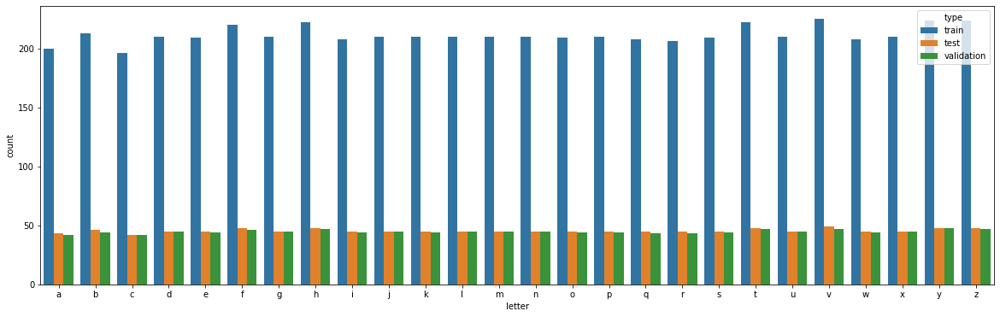

In [ ]:
plt.figure(figsize=(20, 6))
sns.barplot(data=df, x="letter", y="count", hue="type")
plt.show()

As seen here, heights of all bars are roughly consistent. So, the dataset is balanced.

### Preprocess and Augment Images

`ImageDataGenerator` is used to augment the dataset. Arguments to its constructor specify what sort of transforms or filters are to be applied for this purpose.  
The ones used here are:  
- `rescale`: This rescales the pixel values from 0-255 range to 0-1 range.
- `width_shift_range`: This shifts the image horizontally left/right by an amount in the specified range. Contents of space left blank is determined by `fill_mode`
- `height_shift_range`: This shifts the image vertically up/down by an amount in the specified range. Contents of space left blank is determined by `fill_mode`
- `shear_range`: It shifts one part of an image to a direction, and other parts to the opposite direction by an amount withing the specified range.
- `zoom_range`: This zooms the image in or out by a scale in athe specified range. Contents of space left blank is determined by `fill_mode`
- `horizontal_flip`: It takes a boolean value. If `true`, horizontal flips are also used
- `fill_mode`: This determines how empty spaces left by other transforms are filled. Here `"constant"` is used, as it appears to be more suitable for out use case.
-  
The `.flow_from_directory()` method takes the properties of the generated images as a parameter.  
- `directory`: Specifies the directory containing all classes and images
- `target_size`: Specifies the dimensions of the generated images. (200 x 150) is used (reduced from 4000 x 3000) so that model training is more computationally feasible, and to preserve the aspect ratio of the image (4:3) even after resizing.
- `color_mode`: Specifies the colormode of the images. `grayscale` is used as we need grayscale images. Other valid options include `rgb`, `rgba`.
- `class_mode`: As this is a multiclass classification problem, `sparse` is used, and not `binary`.
- `batch_size`: Determines how many images are generated each iteration. As the `view_generator` object is only used for displaying samples of generated images, `1` is used.

In [ ]:
def preprocess_images(img):
    hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    return hsv_img

In [ ]:
view_datagen = ImageDataGenerator(
    rescale=1./255,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="constant",
    preprocessing_function=preprocess_images
)

view_generator = view_datagen.flow_from_directory(
    base_dir,
    target_size=(80, 60),
    # color_mode="grayscale",
    class_mode="sparse",
    batch_size=1
)

Found 7852 images belonging to 3 classes.


`view_generator` is a generator, so we can iterate over it to consume it's items. It can keep on producing items indefinitely, so we need to break the loop once we're done.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

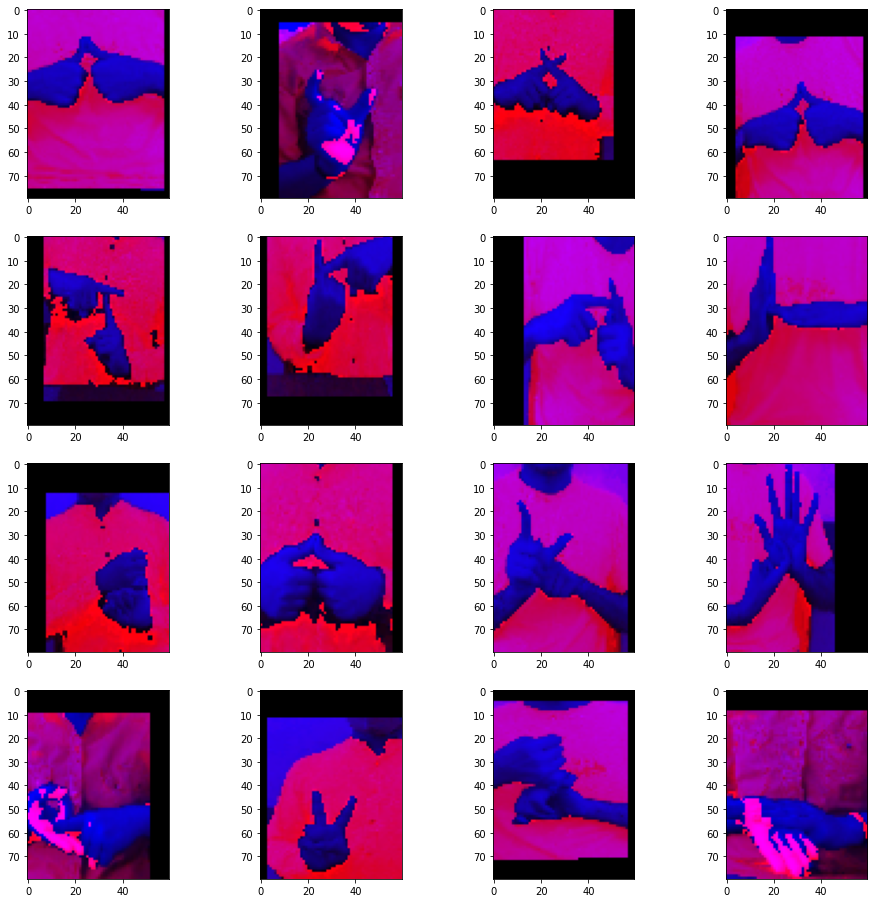

In [ ]:
nrows = 4
ncols = 4

count = 1

plt.figure(figsize=(nrows*4, ncols*4))

for batch in view_generator:
    img = batch[0].reshape((80, 60, 3))
    plt.subplot(nrows, ncols, count)
    plt.imshow(img, cmap="gray")
    count += 1
    if count > (nrows * ncols):
        break
plt.show()

Here we define the generators for training and testing data. Everything is kept same as in case of `view_generator`, except for `batch_size` which is changed to `20`. Number of batches is specified in the model.

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    preprocessing_function=preprocess_images
)

test_datagen = ImageDataGenerator(
    rescale=1./255,
    preprocessing_function=preprocess_images
)

valid_datagen = ImageDataGenerator(
    rescale=1./255,
    preprocessing_function=preprocess_images
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(80, 60),
    class_mode="sparse",
    batch_size=20
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(80, 60),
    class_mode="sparse",
    batch_size=20
)

valid_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(80, 60),
    class_mode="sparse",
    batch_size=20
)

Found 5503 images belonging to 26 classes.
Found 1185 images belonging to 26 classes.
Found 1164 images belonging to 26 classes.


### Build Model

Here we specifie the CNN layout:  
- A 5x5 2D Convolution with 128 filters, activation function ReLU and a 3x3 Max Pooling. This is also the input layer, with input dimensions (200, 150, 1)
- A 2x2 2D Convolution with 64 filters, activation function ReLU and a 2x2 Max Pooling
- A 2x2 2D Convolution with 32 filters, activation function ReLU and a 2x2 Max Pooling
- Flatten the matrics to a vector
- Dense layer with 512 units and activation ReLU
- Add a Drouput Layer with rate 0.35
- Dense layer with 26 units (for 26 classes) with softmax activation function

In [ ]:
model = Sequential([
    Conv2D(32, kernel_size=(2, 2), strides=1,
           activation="relu", input_shape=(80, 60, 3)),
    MaxPool2D(pool_size=(2, 2), strides=2, padding="same"),

    Conv2D(64, kernel_size=(2, 2), strides=1, activation="relu"),
    MaxPool2D(pool_size=(2, 2), strides=2, padding="same"),

    Conv2D(128, kernel_size=(5, 5), strides=1, activation="relu"),
    MaxPool2D(pool_size=(3, 3), strides=2, padding="same"),

    Flatten(),
    Dense(512, activation="relu"),
    Dropout(rate=0.25),

    Dense(26, activation="softmax")
])


Here we compile the model using  
- Adam as the optimiser
- Accuracy as the metric
- Sparse Categorical Cross Entropy as a loss function.

In [ ]:
model.compile(optimizer="rmsprop", loss=keras.losses.SparseCategoricalCrossentropy(), metrics=["acc"])

### Fit and Test Model

Here we fit the model using the `train_generator` and `test_generator`. It runs 20 epochs with 100 steps per epoch.

In [ ]:
%%time

history = model.fit(
    train_generator,
    epochs=25,
    steps_per_epoch=100,
    validation_data=valid_generator,
    validation_steps=50,
    shuffle=1,
    verbose=1
)

Epoch 1/25
100/100 [==============================] - 521s 5s/step - loss: 3.1663 - acc: 0.0770 - val_loss: 2.5509 - val_acc: 0.2090
Epoch 2/25
100/100 [==============================] - 492s 5s/step - loss: 2.4084 - acc: 0.2565 - val_loss: 1.4416 - val_acc: 0.6120
Epoch 3/25
100/100 [==============================] - 484s 5s/step - loss: 1.6246 - acc: 0.4690 - val_loss: 0.5791 - val_acc: 0.8730
Epoch 4/25
100/100 [==============================] - 481s 5s/step - loss: 1.1322 - acc: 0.6425 - val_loss: 0.3241 - val_acc: 0.8940
Epoch 5/25
100/100 [==============================] - 476s 5s/step - loss: 0.8294 - acc: 0.7205 - val_loss: 0.2840 - val_acc: 0.9060
Epoch 6/25
100/100 [==============================] - 470s 5s/step - loss: 0.6090 - acc: 0.7983 - val_loss: 0.2499 - val_acc: 0.9080
Epoch 7/25
100/100 [==============================] - 473s 5s/step - loss: 0.4850 - acc: 0.8335 - val_loss: 0.1666 - val_acc: 0.9420
Epoch 8/25
100/100 [==============================] - 479s 5s/step - 

In [ ]:
import shutil
model.save("model")

shutil.make_archive('model', 'zip', 'model')

'/content/model.zip'

In [ ]:
!nvidia-smi -L
!lscpu |grep 'Model name'
!free -h --si | awk  '/Mem:/{print $2}'

GPU 0: Tesla K80 (UUID: GPU-b88d6079-8792-3126-71cd-68210c1eae16)
Model name:          Intel(R) Xeon(R) CPU @ 2.30GHz
13G


In [ ]:
model = keras.models.load_model("./models/v3-99.90/model")

Text(0.5, 1.0, 'Accuracy evolution')

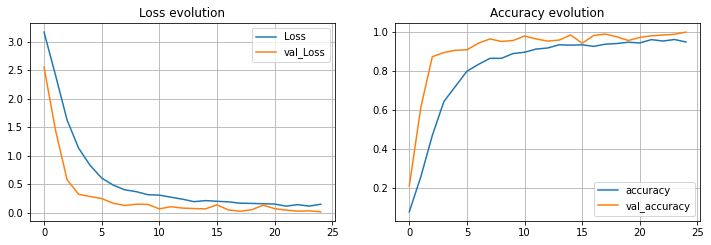

In [ ]:
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='val_Loss')
plt.legend()
plt.grid()
plt.title('Loss evolution')

plt.subplot(2, 2, 2)
plt.plot(history.history['acc'], label='accuracy')
plt.plot(history.history['val_acc'], label='val_accuracy')
plt.legend()
plt.grid()
plt.title('Accuracy evolution')

In [ ]:
model.evaluate(test_generator)

1185/1185 [==============================] - 260s 219ms/step - loss: 0.0179 - acc: 0.9992


[0.017871076241135597, 0.99915611743927]

In [ ]:
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(80, 60),
    class_mode="sparse",
    shuffle=False,
    batch_size=1
)

pred = model.predict(test_generator, verbose=1)
pred = [np.argmax(p) for p in pred]
y_test = test_generator.classes

Found 1185 images belonging to 26 classes.
1185/1185 [==============================] - 226s 190ms/step


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
from sklearn import metrics

cm = metrics.confusion_matrix(y_test, pred)

In [ ]:
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        43
           1       1.00      1.00      1.00        46
           2       1.00      1.00      1.00        42
           3       1.00      1.00      1.00        45
           4       0.98      1.00      0.99        45
           5       1.00      0.98      0.99        48
           6       1.00      1.00      1.00        45
           7       1.00      1.00      1.00        48
           8       1.00      1.00      1.00        45
           9       1.00      1.00      1.00        45
          10       1.00      1.00      1.00        45
          11       1.00      1.00      1.00        45
          12       1.00      1.00      1.00        45
          13       1.00      1.00      1.00        45
          14       1.00      1.00      1.00        45
          15       1.00      1.00      1.00        45
          16       1.00      1.00      1.00        45
          17       1.00    

In [ ]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Computing confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

# Visualizing
    fig, ax = plt.subplots(figsize=(10, 10))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

   # Rotating the tick labels and setting their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
    # Looping over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

Confusion matrix, without normalization


<Figure size 1440x1440 with 0 Axes>

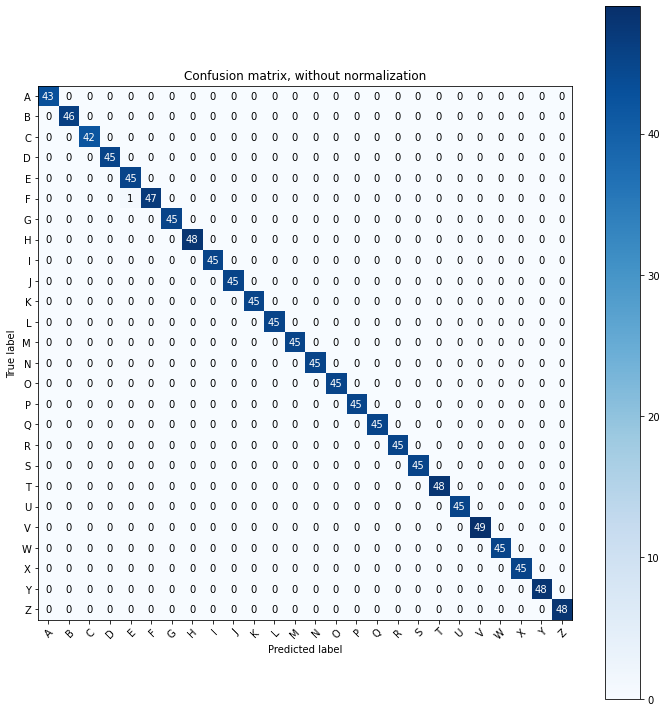

In [ ]:
plt.figure(figsize=(20,20))
plot_confusion_matrix(y_test, pred, classes = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z' ])
plt.show()